<h1 style="color:blue; text-align:center">Vast 2018 Mini Challenge 1</h1>

<h4 style="text-align:center">ABIDA Wassim - EL BEZ Salma - RENAULT Matthieu - SCHUTTE Kathryn</h4><br>
<h4 style="text-align:center">2018, December 3rd</h4>

## Content:
1. [Context](#context)
2. [Exploring the data](#exploring)<br>
    2.1. Recordings metadata<br>
    2.1.1. Cleaning the metadata<br>
    2.1.2. Visualizing the metadata<br>
    2.1.2.1. Tableau exploration<br>
    2.1.3. First Hypotheses<br>
    2.2. Recordings audio files<br>
    2.2.1. Visualizing audio signals<br>
    2.2.2. Extracting audio features<br>
3. [Using Machine Learning to corroborate or discredit our hypothesis](#ml)<br>
    3.1. Binary random forest<br>
    3.2. Neural Network<br>
    3.3. Multi-class random forest<br>
    3.4. Conclusions<br>
4. [Our conclusions on the VAST mini challenge](#conclusion)

# 1. Context <a id="context"></a>

<b>The Rose-crested Blue Pipits’ nesting pairs seem to have decreased alarmingly in the Boonsong Lekagul Wildlife Preserve.</b><br>
Kasios Furniture manufacturing company is suspected of being responsible for this decrease:
<ul>
    <li>Kasios supposedly used the banned substance Methylosmolene in their manufacturing process</li>
    <li>They surreptitiously <b>dumped process waste</b> in the northeast region of the Preserve</li>
    <li>Methylosmolene was detected in their smokestack emissions.</li>
</ul>
Kasios now claims that the analysis was flawed and biased:
<ul>
    <li>Kasios has launched their own investigation into the Pipit situation.</li>
    <li>They are reporting that there are <b>plenty</b> of Rose-crested Blue Pipits happily living and nesting in the Preserve.</li>
    <li>To back up this claim, they have provided a <b>set of Pipit bird calls, recently recorded across the Preserve</b>, with locations of where they were recorded.</li>
</ul>
Mistford College have a collection of bird calls from the Preserve that has been vetted by various ornithology groups as having accurate identifications.<br>

<b><u>GOAL:</u> We want to use data analytics and visualization tools to support or refute Kasios claim. </b>

# 2. Exploring the data <a id="exploring"></a>

## 2.1. Recordings metadata

In [2]:
#IMPORTS
import pandas as pd
import numpy as np
import datetime as dt
import calendar
import pickle

In [3]:
#load dataframe
df_allbirds = pd.read_csv("../AllBirdsv4.csv")
df_kasios = pd.read_csv( "../Test Birds Location.csv")

In [4]:
df_allbirds.head()

,File ID,English_name,Vocalization_type,Quality,Time,Date,X,Y
0,402254,Rose-crested Blue Pipit,call,no score,13:30,2/8/2018,49,63
1,406171,Rose-crested Blue Pipit,call,A,7:48,6/7/2017,125,133
2,405901,Rose-crested Blue Pipit,call,A,12:00,2/8/2018,58,76
3,405548,Rose-crested Blue Pipit,song,A,11:00,3/10/2018,55,125
4,401782,Rose-crested Blue Pipit,song,A,6:00,6/29/2008,129,123


In [5]:
df_kasios.head()

,ID,X,Y
0,1,140,119
1,2,63,153
2,3,70,136
3,4,78,150
4,5,60,90


### 2.1.1. Cleaning the metadata

#### ALLBIRDS DATASET

We first have to clean the recordings metadata dataset.<br>
The resulting data set contains the following fields:
- **File ID:** id of the corresponding recording
- **English_name:** name of the bird breed
- **Vocalization_type:** type of bird sound that is: call or song.
- **Quality**: the quality of the recording: A, B, C, D
- **Time**: time of the recording: AM for morning, PM for afternoon
- **X, Y**: coordinates of where the recordings were taken in the preserve
- **Year, Month**: date of the recording
- **Weekday**: day of the week of the recording

In [6]:
def compute_weekday(year, month, day):
    if ((year * month * day) != 0):
        date = dt.date(year, month, day)
        weekday = date.weekday()
        return calendar.day_name[weekday]
    else:
        return "NaN"

In [7]:
#FILE ID : ok 

#English_name: ok 19 classes

#VOCALISATION_TYPE
#there are 11 uncleaned voc types
#first lets put all voc types to lower cases
df_allbirds['Vocalization_type'] = df_allbirds['Vocalization_type'].str.lower()
#let's remove space characters
df_allbirds['Vocalization_type'] = df_allbirds['Vocalization_type'].str.strip()
#now there are 7 remaining voc_types
#let's put all voc types that are not calls in songs
voc = df_allbirds['Vocalization_type'].copy()
other_voc = voc.isin(['call', 'song']) == False
voc[other_voc] = 'song'
df_allbirds['Vocalization_type'] = voc

#QUALITY
#let's group together 'D', 'E' and 'no score' to the 'D' category:
qual = df_allbirds['Quality'].copy()
low_qual = qual.isin(['E', 'no score'])
qual[low_qual] = 'D'
df_allbirds['Quality'] = qual

#TIME
# we want to simplify this data to 'morning' and 'afternoon'
df_allbirds['Time'] = df_allbirds['Time'].str.lower()
df_allbirds['Time'].str.strip()
time = df_allbirds['Time'].copy()
time[time.str.contains('am') | time.str.contains('morning') | time.str.contains('dawn')] = 'AM'
time[time.str.contains('night') | time.str.contains('pm')] = 'PM'
time[time.str.startswith('?')] = 'NaN'
time[time.str.contains(':')] = time[time.str.contains(':')].str.split(':', 1).str[0]
time[time.str.contains('.')] = time[time.str.contains('.')].str.split('.', 1).str[0]
time[time.str.contains(';')] = time[time.str.contains(';')].str.split(';', 1).str[0]
for i, t in enumerate(time):
    if time[i].isdigit():
        t_num = pd.to_numeric(time[i], downcast='integer')
        if (t_num <= 12):
            time[i] = 'AM'
        elif (t_num <= 24):
            time[i]='PM'
drop = time.isin(['AM', 'PM']) == False
# Warning ! We are arbitrary setting all the unknowns to PM
time[drop] = 'PM'
df_allbirds['Time'] = time

#DATE
#We want to keep only the month and the year
date = df_allbirds['Date'].copy()
year = date.copy()
month = date.copy()
day = date.copy()
# process the 2 different date format: yyyy-mm-dd and mm/dd/yyyy
year[date.str.contains('-')] = date[date.str.contains('-')].str.split('-').str[0]
month[date.str.contains('-')] = date[date.str.contains('-')].str.split('-').str[1]
day[date.str.contains('-')] = date[date.str.contains('-')].str.split('-').str[2]
year[date.str.contains('/')] = date[date.str.contains('/')].str.split('/').str[2]
month[date.str.contains('/')] = date[date.str.contains('/')].str.split('/').str[0]
day[date.str.contains('/')] = date[date.str.contains('/')].str.split('/').str[1]
df_allbirds['Year'] = pd.to_numeric(year)
df_allbirds['Month'] = pd.to_numeric(month)
df_allbirds['Day'] = pd.to_numeric(day)
df_allbirds['Weekday'] = df_allbirds.apply(lambda row: compute_weekday(row['Year'], row['Month'], row['Day']), axis=1)
df_allbirds.drop(['Date', 'Day'], axis=1, inplace=True) #we can now drop the date column
# Warning ! there are 0 values for months and years but we don't want to set arbitrary 
#values because it is important to know the distrubution of birds over the years

#COORDINATE X: Ok

#COORDINATE Y
# Replace values that are not digits with ''
df_allbirds['Y'].replace(regex=True,inplace=True,to_replace=r'\D',value=r'')
#Convert strings to numeric values (here, int)
df_allbirds['Y'] = pd.to_numeric(df_allbirds['Y'])

In [8]:
df_allbirds.head()

,File ID,English_name,Vocalization_type,Quality,Time,X,Y,Year,Month,Weekday
0,402254,Rose-crested Blue Pipit,call,D,PM,49,63,2018,2,Thursday
1,406171,Rose-crested Blue Pipit,call,A,AM,125,133,2017,6,Wednesday
2,405901,Rose-crested Blue Pipit,call,A,AM,58,76,2018,2,Thursday
3,405548,Rose-crested Blue Pipit,song,A,AM,55,125,2018,3,Saturday
4,401782,Rose-crested Blue Pipit,song,A,AM,129,123,2008,6,Sunday


#### KASIOS DATASET

In [9]:
df_kasios.rename(index=str, columns={" X": "X", " Y": "Y"}, inplace = True)

In [10]:
df_kasios.head()

,ID,X,Y
0,1,140,119
1,2,63,153
2,3,70,136
3,4,78,150
4,5,60,90


### 2.1.2. Visualizing the metadata

#### PREPROCESSING MAP IMAGE

In [11]:
from PIL import Image
import io
import urllib.request

In [12]:
# convert image pixels to black & white
# any value that is not black is assigned the value white
URL = "http://raw.githubusercontent.com/KathrynSch/datavis_MSKW/master/Lekagul%20Roadways%202018.bmp"

with urllib.request.urlopen(URL) as url:
    with open('temp.bmp', 'wb') as f:
        f.write(url.read())

img = Image.open('temp.bmp').convert('L')
img.resize((700,700), resample=Image.BICUBIC)
np_img = np.array(img)
np_img[np_img > 0] = 255 #Binarize
np_img[np_img == 0] = 0 #Binarize
img=np.flipud(np_img)

In [13]:
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
%matplotlib inline
import bokeh.client
from bokeh.io import push_notebook, output_notebook, show
from bokeh.plotting import figure, show, output_file
from bokeh.models.markers import Hex
from bokeh.models import CustomJS, Slider, Legend, HoverTool, ColumnDataSource, DataSource, WidgetBox
from bokeh.layouts import layout
output_notebook()

Loading BokehJS ...

#### Quanitity of recordings per bird breed

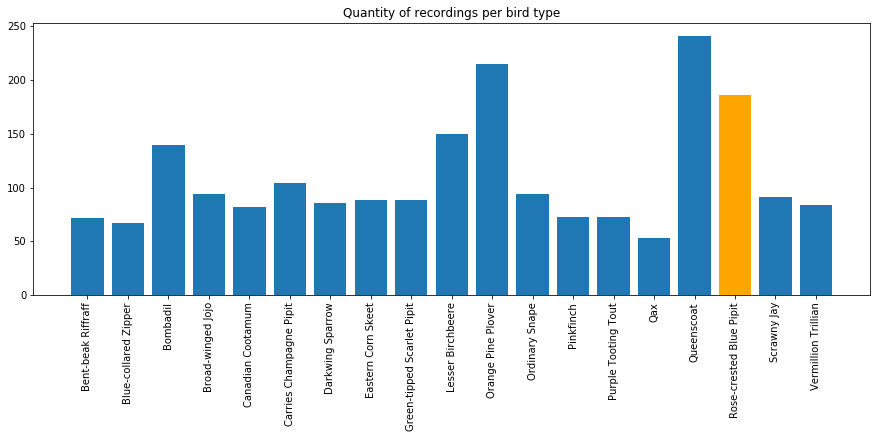

In [14]:
record_counts = df_allbirds.groupby('English_name').size().reset_index(name='Counts')
pipit = record_counts[record_counts['English_name']=='Rose-crested Blue Pipit']
plt.figure(figsize=(15,5))
plt.title('Quantity of recordings per bird type')
plt.bar(record_counts['English_name'], record_counts['Counts'])
plt.bar(pipit['English_name'], pipit['Counts'], color='orange')
plt.xticks(record_counts['English_name'], rotation='vertical')
plt.show()

#### Number of recordings per year

<BarContainer object of 20 artists>

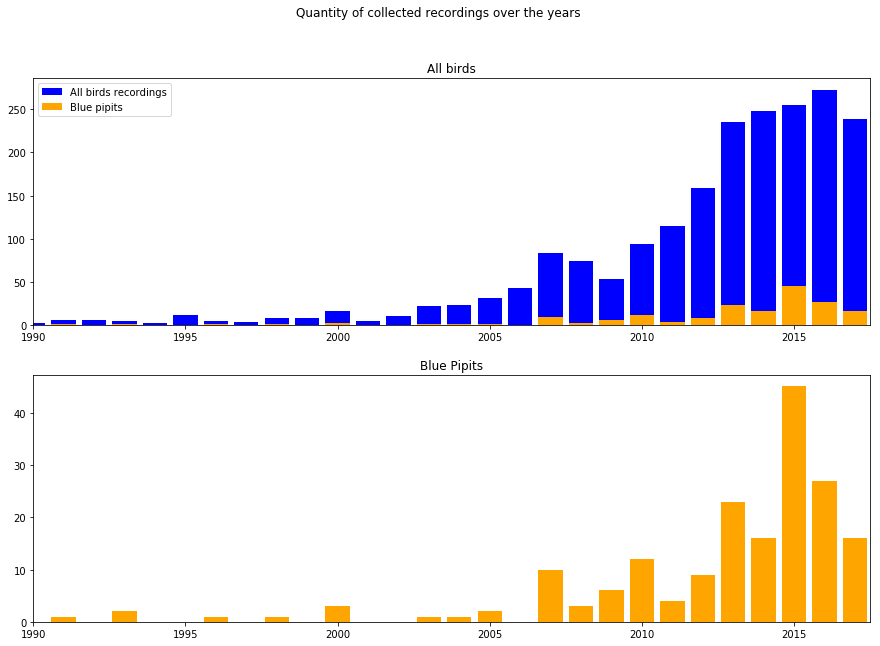

In [15]:
all_year_counts = df_allbirds[df_allbirds['Year']!=0].groupby('Year').size().reset_index(name='Counts')
pipit_year_counts = df_allbirds[(df_allbirds['Year']!=0) 
                                & (df_allbirds['English_name']=='Rose-crested Blue Pipit')
                               ].groupby('Year').size().reset_index(name='Counts')
plt.figure(figsize=(15,10))
plt.suptitle('Quantity of collected recordings over the years')
plt.subplot(211)
plt.bar(all_year_counts['Year'], all_year_counts['Counts'], color='blue', label='All birds recordings')
plt.bar(pipit_year_counts['Year'], pipit_year_counts['Counts'], color='orange', label='Blue pipits')
plt.xlim(1990, 2017.5)
plt.title('All birds')
plt.legend()
plt.subplot(212)
plt.title('Blue Pipits')
plt.xlim(1990, 2017.5)
plt.bar(pipit_year_counts['Year'], pipit_year_counts['Counts'], color='orange', label='Blue pipits')

Note that we decided to ignore the data of 2018 since it is not comprehensive, thus irrelevant in this plot.
We observe that the amount of recordings has been decreasing for all birds since 2016 but the decrease is very significant since 2015 for the blue pipits recordings particularly.
In 2016: while the overall amount of recordings has increased, the amount of recordings of blue pipits sounds has severely decreased.

#### Understanding the birds localizations

In [16]:
df_pipits = df_allbirds[df_allbirds['English_name'] == "Rose-crested Blue Pipit"]
df_others = df_allbirds[df_allbirds['English_name'] != "Rose-crested Blue Pipit"]

In [17]:
p = figure(x_range=(0, 199), y_range=(0, 199), title = "Recordings positions in the Preserve", plot_width=700, plot_height=700)
# set axis labels
p.xaxis.axis_label = 'Coordinate X'
p.yaxis.axis_label = 'Coordinate Y'
#plot map image
p.image(image=[img], x=0, y=0, dw=200, dh=200, global_alpha=0.5, dilate=True)
#plot recordings 
p.circle(df_others["X"], df_others["Y"], fill_alpha=0.6, size=3, legend="Non Blue Pipits recordings from University")
p.circle(df_pipits["X"], df_pipits["Y"], color='blue', fill_alpha=0.7, size=8, legend="Blue Pipits recordings from University")
p.circle(df_kasios["X"], df_kasios["Y"], color='red', size=10, legend="Blue Pipits recordings from Kasios")
#plot waste dumpings
p.square(148, 159, size=19, fill_alpha=0.7, color='green', legend="Kasios waste dumpings")
#legend properties
p.legend.location ="bottom_right"
p.legend.click_policy="hide"
p.add_tools(HoverTool(
    tooltips=[
    ("(X,Y)", "($x, $y)"),
]))
#title properties
p.title.text_font_size = '15pt'
p.title.align = 'center'
#show plot inside notebook
show(p, notebook_handle = True)

This graph shows that Blue Pipits are mainly located in the north east part of the preserve. <br>
It also shows that the positions of Kasios recordings does not fit with the visual distribution of Blue Pipits.

In [18]:
from ipywidgets import interact

In [100]:
pipits_source = ColumnDataSource(data=dict(
    x=df_pipits['X'], 
    y=df_pipits['Y']))
others_source = ColumnDataSource(data=dict(
    x=df_others['X'], 
    y=df_others['Y']))
kasio_source = ColumnDataSource(data=dict(
    x=df_kasios['X'], 
    y=df_kasios['Y']))
dump_source = ColumnDataSource(data=dict(
    x=[148],
    y=[159]))

p = figure(x_range=(0, 199), y_range=(0, 199), 
           title = "Evolution of birds positions through the years", 
           plot_width=700, plot_height=700)
# set axis labels
p.xaxis.axis_label = 'Coordinate X'
p.yaxis.axis_label = 'Coordinate Y'
#plot map image
p.image(image=[img], x=0, y=0, dw=200, dh=200, global_alpha=0.5, dilate=True)

#plot recordings 
p.circle(x='x', y='y', source=pipits_source, color='blue', fill_alpha=0.7, size=9, 
         legend="Blue Pipits recordings from University")
p.circle(x='x', y='y', source=others_source, fill_alpha=0.6, size=5, 
         legend="Non Blue Pipits recordings from University")
p.circle(x='x', y='y', source=kasio_source, color='red', fill_alpha=0.7, size=9, 
         legend="Kasio recordings")
p.square(x='x', y='y', source=dump_source, size=15, fill_alpha=0.6, color='green', legend="Kasio dumping site")

p.legend.location ="bottom_right"
p.legend.click_policy="hide"
#title properties
p.title.text_font_size = '15pt'
p.title.align = 'center'

def update(year, kasio, dumping):
    pipits_source.data = dict(
        x = df_pipits.loc[df_pipits['Year']==year, 'X'],
        y = df_pipits.loc[df_pipits['Year']==year, 'Y'])
    others_source.data = dict(
        x = df_others.loc[df_others['Year']==year, 'X'],
        y = df_others.loc[df_others['Year']==year, 'Y'])
    if kasio is True:
        kasio_source.data = dict(
            x=df_kasios['X'], 
            y=df_kasios['Y'])
    else:
        kasio_source.data = dict(
            x=[], 
            y=[])
    if dumping is True:
        dump_source.data = dict(
            x=[148], 
            y=[159])
    else:
        dump_source.data = dict(
            x=[], 
            y=[])
    push_notebook()
    
min_year = df_allbirds.loc[df_allbirds['Year']!=0, 'Year'].min()
max_year = df_allbirds['Year'].max()
interact(update, year=(min_year, max_year), kasio=True, dumping=True)
show(p, notebook_handle=True)

interactive(children=(IntSlider(value=2000, description='year', max=2018, min=1983), Checkbox(value=True, desc…

This interactive graph helps us understanding that the Blue Pipit birds have been moving over the years. They were first massively gathered in the north east of the preserve, around the position of the dumping site. <br>
We can notice that they have started migrating towards the south and the rest of the preserve since 2015.<br>
This leads us to assume that Kasios has been dumping toxical waste in the preserve since at least 2015, and that it has influenced the localizations of the Blue Pipits birds.

#### Distance of blue pipits recordings from Kasio dumping

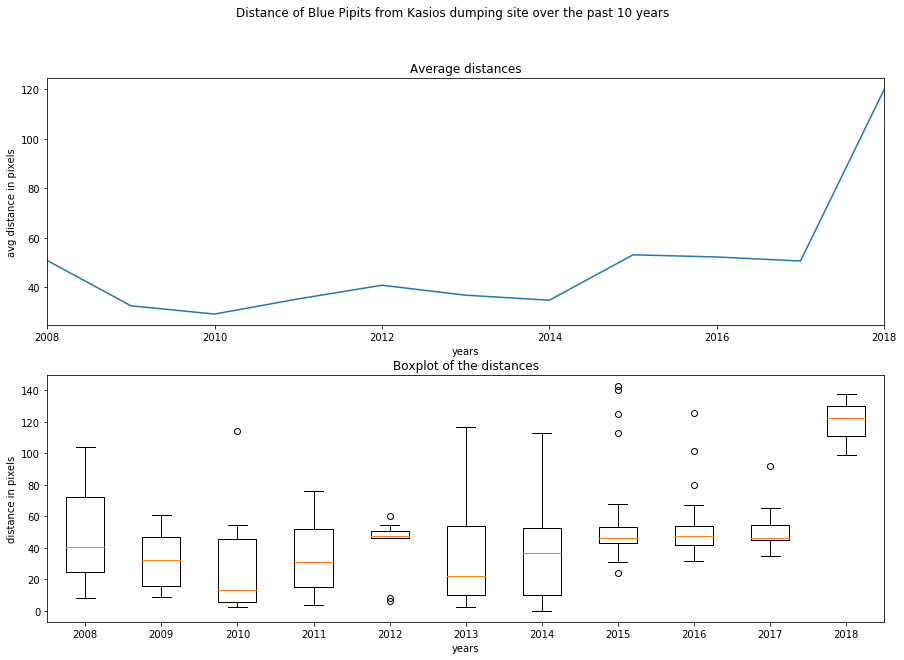

In [20]:
pipit_years = np.unique(df_pipits.loc[df_pipits['Year']>=2008, 'Year'])
dumping = [148, 159]
all_dist = []
avg_dist = []
for year in pipit_years:
    positions = df_pipits.loc[df_pipits['Year']==year, ['X', 'Y']].values
    dist=[]
    for pos in positions:
        dist.append(np.linalg.norm(pos-dumping))
    all_dist.append(dist)
    avg_dist.append(np.average(dist))
plt.figure(figsize=(15,10))
plt.suptitle('Distance of Blue Pipits from Kasios dumping site over the past 10 years')
plt.subplot(211)
plt.title('Average distances')
plt.xlim(2008, 2018)
plt.xlabel('years')
plt.ylabel('avg distance in pixels')
plt.plot(pipit_years, avg_dist)
plt.subplot(212)
plt.title('Boxplot of the distances')
plt.xlim(2008, 2018)
plt.xlabel('years')
plt.ylabel('distance in pixels')
plt.boxplot(all_dist, labels = pipit_years)
plt.show()

This plots show the average euclidean distance of Blue Pipits recordings from the position of Kasio dumping site.
We used the data from the past 10 years only because there are too few recordings before 2008 to make a relevant observation.
The trend of this line clearly shows that Blue Pipits have been progressively moving away from the dumping site.

### 2.1.3. First hypotheses

The visualizations above pointed out:
<ul>
    <li>The number of blue pipits recordings have been decreasing since 2015.</li>
    <li>The blue pipit birds have been predominantly recorded in the north east region of the preserve. </li>
    <li>Since 2015, blue pipit birds have been recorded in other parts of the preserve.</li>
    <li>The average distance of blue pipits from the dumping site has been increasing over years.</li>
</ul>
These observations lead us to the following assumptions:
<ul>
    <li>The population of Blue Pipit birds have been decreasing since 2015.</li>
    <li>Kasios manufacturing company has been dumping its toxic wastes in the preserve since at least 2015.</li>
    <li>The waste dumpings are harmful for the Blue Pipit birds since they have naturally started moving away from this area, and their population decreased.</li>
</ul>

## 2.2. Recordings audio files

### 2.2.1. Visualizing audio signals

In [21]:
import scipy.io.wavfile
import pydub
import os
from numpy import fft
import re
import glob2
import librosa
from matplotlib.pyplot import specgram
from librosa import power_to_db
import librosa.display
import warnings
warnings.filterwarnings("ignore")

In [22]:
DIR_ALL_BIRDS = "../ALL BIRDS/"
#Location of temp wav files
TEMP_ALL_BIRDS = "../temp_all_birds/"
#Sampling rate
RATE = 22050

#### Selecting audio files we want to visualize

In [23]:
def select_recordings(bird_types, voc_type, quality, samples):
    df_select = df_allbirds.drop(df_allbirds.index)
    for bird in bird_types:
        df_temp = df_allbirds[(df_allbirds['English_name'] == bird) &
                            (df_allbirds['Vocalization_type'] == 'call') & 
                            (df_allbirds['Quality'] == 'A')]
        size = len(df_temp)
        if size < samples:
            df_temp = df_temp.sample(n=size)
            print("!! - Only "+str(size)+" row(s) matching criteria for "+ bird +" bird.")
        else:
            df_temp = df_temp.sample(n=samples)
        df_select = pd.merge(df_select, df_temp, how='outer')
    return df_select

In [24]:
bird_types = df_allbirds['English_name'].unique()
df_test = select_recordings(bird_types, 'call', 'A', 1)

#### Reading audio files

In [25]:
def read_mp3_as_wav(mp3_dir, wav_dir, files_id):
    bird_ids=[]
    audio_list = []
    for mp3_file_name in os.listdir(mp3_dir): #for each file in dir
        file_id = mp3_file_name.split('.')[0].split('-')[-1] # extract file id from file name
        if int(file_id) in files_id:  # if file id in selected files
            mp3_file = pydub.AudioSegment.from_mp3(mp3_dir + mp3_file_name) #read the mp3 file
            mp3_file.export(wav_dir + file_id + ".wav", format = "wav") #convert it to wav
            audio, _ = librosa.core.load(wav_dir + file_id+ ".wav", sr=RATE, mono=True, offset=0.0, duration=None, res_type='kaiser_best')
            audio_list.append(audio)
            bird_ids.append(int(file_id))
    return audio_list, bird_ids

In [26]:
all_birds_audios, all_birds_ids = read_mp3_as_wav(DIR_ALL_BIRDS, TEMP_ALL_BIRDS, np.array(df_test['File ID']))

In [27]:
# Define the new bird types list (a permutation was performed when reading the wav files)
all_birds_names = []
for file in all_birds_ids:
    all_birds_names.append(df_test.loc[df_test["File ID"] == file, "English_name"].values[0])

#### Definition of plot functions

In [28]:
def plot_waves(sound_names, raw_sounds):
    i = 1
    fig = plt.figure(figsize=(20, 5*len(raw_sounds)))
    for name, sound in zip(sound_names, raw_sounds):
        plt.subplot(len(raw_sounds), 1, i)
        librosa.display.waveplot(np.array(sound), sr=RATE)
        plt.title(name)
        i += 1
    #plt.suptitle("Figure 1: Waveplot",x=0.5, y=0.915, fontsize=18)
    plt.tight_layout()
    plt.show()

def plot_specgram(sound_names, raw_sounds):
    i = 1
    fig = plt.figure(figsize=(20, 5*len(raw_sounds)))
    for name, sound in zip(sound_names, raw_sounds):
        plt.subplot(len(raw_sounds), 1, i)
        specgram(np.array(sound), Fs=RATE)
        plt.title(str(name))
        i += 1
    #plt.suptitle("Figure 2: Spectrogram",x=0.5, y=0.915, fontsize=18)
    plt.show()


def plot_log_power_specgram(sound_names, raw_sounds):
    i = 1
    fig = plt.figure(figsize=(20, 5*len(raw_sounds)))
    for name, sound in zip(sound_names, raw_sounds):
        plt.subplot(len(raw_sounds), 1, i)
        D = librosa.power_to_db(np.abs(librosa.stft(sound))**2, ref=np.max)
        librosa.display.specshow(D, x_axis='time', y_axis='log')
        plt.colorbar(format='%+2.0f dB')
        plt.title(name)
        i += 1
    #plt.suptitle("Figure 3: Log power spectrogram",x=0.5, y=0.915, fontsize=18)
    plt.show()

#### Figure 1: Waveplots

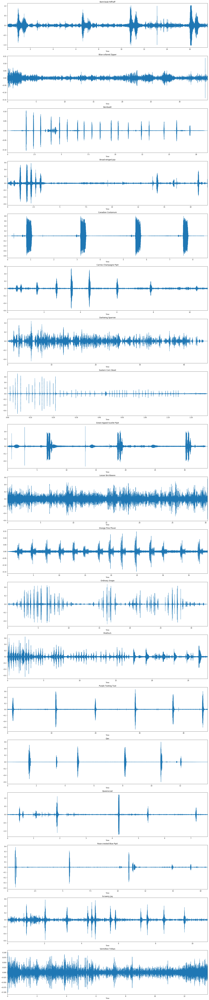

In [29]:
plot_waves(all_birds_names, all_birds_audios)

#### Figure 2: Spectrograms

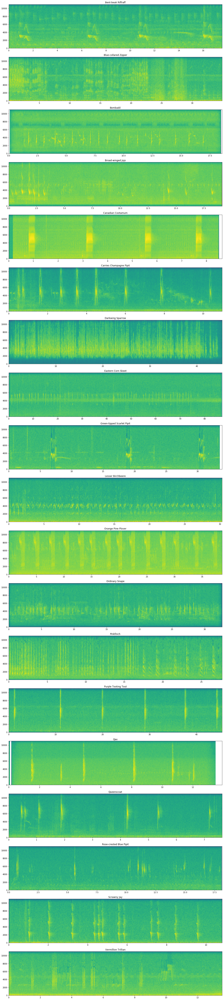

In [30]:
plot_specgram(all_birds_names, all_birds_audios)

#### Figure 3: Log power spectrograms

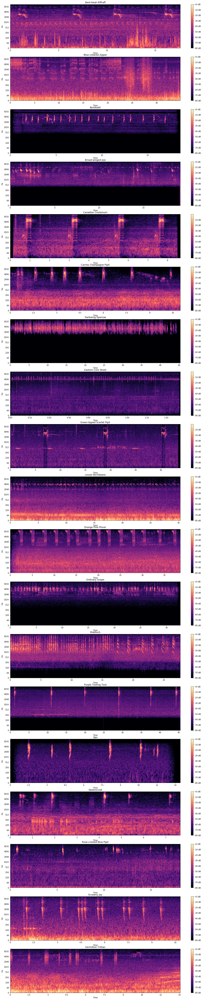

In [31]:
plot_log_power_specgram(all_birds_names, all_birds_audios)

From these three figures above, we can see that there are significant differences in bird sounds and that these phisical features can be used to try to differentiate them and claffify them. <br>
However, since there are 19 different bird types, human eyes are not the most appropriate to do this classification task.<br>
In next section, we will try extracting features that can feed machine learning algorithms.

### 2.2.2. Extracting audio features

To extract the useful features from sound data, we will use Librosa library. It provides several methods to extract different features from the sound clips.
<ul>
    <li>Melspectrogram: Compute a Mel-scaled power spectrogram</li>
    <li>Mfccs: Mel-frequency spectral coefficients</li>
    <li>Chorma-stft: Compute a chromagram from a waveform or power spectrogram</li>
    <li>Spectral_contrast: Compute spectral contrast</li>
    <li>Tonnetz: Computes the tonal centroid features (tonnetz)</li>
</ul>

In [32]:
def extract_feature(X,sample_rate):
    stft = np.abs(librosa.stft(X))
    mfccs = np.mean(librosa.feature.mfcc(y=X, sr=sample_rate, n_mfcc=40).T,axis=0)
    chroma = np.mean(librosa.feature.chroma_stft(S=stft, sr=sample_rate).T,axis=0)
    mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
    contrast = np.mean(librosa.feature.spectral_contrast(S=stft, sr=sample_rate).T,axis=0)
    tonnetz = np.mean(librosa.feature.tonnetz(y=librosa.effects.harmonic(X),
    sr=sample_rate).T,axis=0)
    return mfccs,chroma,mel,contrast,tonnetz

In [33]:
mfccs,chroma,mel,contrast,tonnetz = extract_feature(all_birds_audios[0],sample_rate=RATE)
ext_features = np.hstack([mfccs,chroma,mel,contrast,tonnetz])
ext_features  ## the result is a vector of length 193 (193 features extracted)

array([-1.82582410e+02,  8.94072120e+01, -2.96141487e+01,  1.31475100e+01,
       -1.33419396e+01,  1.62436565e+00, -1.24774173e+00,  1.33482188e+01,
        9.88067225e-01,  4.72128383e+00,  3.15524716e+00,  4.17439228e+00,
       -6.59056866e+00,  9.86453654e+00,  2.23594870e-02,  7.21044507e+00,
       -2.87708142e-02,  4.75618926e+00, -3.09811077e-01,  6.67692387e+00,
        6.01701664e+00, -1.64529299e+00, -1.58829611e+00,  3.73193665e+00,
        1.64448590e+00,  1.15830709e+00,  1.93036833e+00,  1.65424175e+00,
       -2.88005378e+00,  5.63218827e+00, -2.17784506e+00,  9.93644103e-01,
        5.89805928e+00,  3.22529991e+00,  3.56432140e+00,  1.77232717e+00,
       -3.36566225e+00,  6.40941855e+00, -5.39453322e-01,  3.01776038e+00,
        6.70379894e-01,  5.93627813e-01,  6.13053625e-01,  5.91390446e-01,
        6.24686162e-01,  7.43806245e-01,  7.84269808e-01,  6.85365875e-01,
        6.07179629e-01,  6.06602663e-01,  6.43634961e-01,  6.74197576e-01,
        3.85983170e+00,  

# 3.Using Machine Learning to corroborate or discredit our hypothesis <a id="ml"></a>

## 3.1. Binary Random Forest

In [1]:
#IMPORTS
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer, make_column_transformer
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn import metrics

In [34]:
#Paths
Temp_Kasios_test_mp3 = "../Test Birds from Kasios/"
Temp_Kasios_test_wav = "../temp_kasios/"

#### Data Processing

Merging with the extracted audio features:

In [35]:
# Loading features of all birds 
file_df_all_2 = open('df_all.obj', 'rb')
df_all_raw = pickle.load(file_df_all_2)

In [36]:
df_all_raw.head()

,File ID,English_name,Vocalization_type,Quality,Time,Date,X,Y,X0,X1,...,X183,X184,X185,X186,X187,X188,X189,X190,X191,X192
0,402254,Rose-crested Blue Pipit,call,no score,13:30,2/8/2018,49,63,-126.859482,52.672793,...,12.945465,14.688967,15.195623,34.125219,0.000607,0.000578,0.010736,0.006368,0.003017,0.001467
1,406171,Rose-crested Blue Pipit,call,A,7:48,6/7/2017,125,133,-518.573115,80.125307,...,13.885705,16.579633,17.020169,30.764052,-0.002988,-0.003856,-0.020490,0.003034,0.003746,-0.002461
2,405901,Rose-crested Blue Pipit,call,A,12:00,2/8/2018,58,76,-360.869115,92.553981,...,15.515316,13.824953,17.982726,30.690494,0.004628,-0.005693,-0.000714,-0.006213,-0.000575,-0.003416
3,405548,Rose-crested Blue Pipit,song,A,11:00,3/10/2018,55,125,-484.838371,94.939706,...,15.700569,19.095648,21.528838,30.077242,-0.003585,-0.001568,0.020426,-0.009749,-0.002221,-0.009237
4,401782,Rose-crested Blue Pipit,song,A,6:00,6/29/2008,129,123,-508.212379,-42.278746,...,16.774704,17.565544,24.350953,31.433605,0.018353,-0.042091,0.052767,-0.038390,-0.014295,-0.016700


In [37]:
# taking into account positions x and y and X0 .. X193 
df_sound_features = df_all_raw.drop(['English_name', 'Vocalization_type', 'Quality', 'Time', 'Date', 'X', 'Y'], axis=1)
df_sound_features.head()

,File ID,X0,X1,X2,X3,X4,X5,X6,X7,X8,...,X183,X184,X185,X186,X187,X188,X189,X190,X191,X192
0,402254,-126.859482,52.672793,-17.312550,8.408767,-14.842581,22.713141,-12.399958,7.721043,-2.872551,...,12.945465,14.688967,15.195623,34.125219,0.000607,0.000578,0.010736,0.006368,0.003017,0.001467
1,406171,-518.573115,80.125307,-24.867800,-14.420098,-36.210431,-9.612487,-16.309039,-17.607467,-12.512816,...,13.885705,16.579633,17.020169,30.764052,-0.002988,-0.003856,-0.020490,0.003034,0.003746,-0.002461
2,405901,-360.869115,92.553981,48.549883,52.697855,-11.208339,27.513717,3.450712,7.005520,19.312979,...,15.515316,13.824953,17.982726,30.690494,0.004628,-0.005693,-0.000714,-0.006213,-0.000575,-0.003416
3,405548,-484.838371,94.939706,37.478998,40.566452,1.584098,7.761096,4.895766,10.613795,8.489450,...,15.700569,19.095648,21.528838,30.077242,-0.003585,-0.001568,0.020426,-0.009749,-0.002221,-0.009237
4,401782,-508.212379,-42.278746,-58.024583,19.058017,-25.968230,31.673461,15.830161,-14.508791,-2.511825,...,16.774704,17.565544,24.350953,31.433605,0.018353,-0.042091,0.052767,-0.038390,-0.014295,-0.016700


#### Merging Extracted features with categorical variables

In [38]:
df_all = pd.merge(df_allbirds, df_sound_features, on ='File ID')
df_all.drop('File ID', axis=1, inplace=True)

In [39]:
df_all.head()

,English_name,Vocalization_type,Quality,Time,X,Y,Year,Month,Weekday,X0,...,X183,X184,X185,X186,X187,X188,X189,X190,X191,X192
0,Rose-crested Blue Pipit,call,D,PM,49,63,2018,2,Thursday,-126.859482,...,12.945465,14.688967,15.195623,34.125219,0.000607,0.000578,0.010736,0.006368,0.003017,0.001467
1,Rose-crested Blue Pipit,call,A,AM,125,133,2017,6,Wednesday,-518.573115,...,13.885705,16.579633,17.020169,30.764052,-0.002988,-0.003856,-0.020490,0.003034,0.003746,-0.002461
2,Rose-crested Blue Pipit,call,A,AM,58,76,2018,2,Thursday,-360.869115,...,15.515316,13.824953,17.982726,30.690494,0.004628,-0.005693,-0.000714,-0.006213,-0.000575,-0.003416
3,Rose-crested Blue Pipit,song,A,AM,55,125,2018,3,Saturday,-484.838371,...,15.700569,19.095648,21.528838,30.077242,-0.003585,-0.001568,0.020426,-0.009749,-0.002221,-0.009237
4,Rose-crested Blue Pipit,song,A,AM,129,123,2008,6,Sunday,-508.212379,...,16.774704,17.565544,24.350953,31.433605,0.018353,-0.042091,0.052767,-0.038390,-0.014295,-0.016700


Encoding our target:

In [40]:
df_all["Rose-crested_Blue_Pipit"] = 0
df_all.loc[df_all["English_name"] == "Rose-crested Blue Pipit", 'Rose-crested_Blue_Pipit'] = 1
df_all.drop('English_name', axis=1, inplace=True)

In [41]:
df_all.head()

,Vocalization_type,Quality,Time,X,Y,Year,Month,Weekday,X0,X1,...,X184,X185,X186,X187,X188,X189,X190,X191,X192,Rose-crested_Blue_Pipit
0,call,D,PM,49,63,2018,2,Thursday,-126.859482,52.672793,...,14.688967,15.195623,34.125219,0.000607,0.000578,0.010736,0.006368,0.003017,0.001467,1
1,call,A,AM,125,133,2017,6,Wednesday,-518.573115,80.125307,...,16.579633,17.020169,30.764052,-0.002988,-0.003856,-0.020490,0.003034,0.003746,-0.002461,1
2,call,A,AM,58,76,2018,2,Thursday,-360.869115,92.553981,...,13.824953,17.982726,30.690494,0.004628,-0.005693,-0.000714,-0.006213,-0.000575,-0.003416,1
3,song,A,AM,55,125,2018,3,Saturday,-484.838371,94.939706,...,19.095648,21.528838,30.077242,-0.003585,-0.001568,0.020426,-0.009749,-0.002221,-0.009237,1
4,song,A,AM,129,123,2008,6,Sunday,-508.212379,-42.278746,...,17.565544,24.350953,31.433605,0.018353,-0.042091,0.052767,-0.038390,-0.014295,-0.016700,1


Taking care of the features:

In [42]:
df_features = df_all.drop(['Vocalization_type', 'Quality', 'Time', 'Year','Month','Weekday'], axis=1)

In [43]:
features = df_features.loc[:, df_features.columns != 'Rose-crested_Blue_Pipit']

In [44]:
features = features.astype(float) #Convert all the dataframe in floats

In [45]:
features.head()

,X,Y,X0,X1,X2,X3,X4,X5,X6,X7,...,X183,X184,X185,X186,X187,X188,X189,X190,X191,X192
0,49.0,63.0,-126.859482,52.672793,-17.312550,8.408767,-14.842581,22.713141,-12.399958,7.721043,...,12.945465,14.688967,15.195623,34.125219,0.000607,0.000578,0.010736,0.006368,0.003017,0.001467
1,125.0,133.0,-518.573115,80.125307,-24.867800,-14.420098,-36.210431,-9.612487,-16.309039,-17.607467,...,13.885705,16.579633,17.020169,30.764052,-0.002988,-0.003856,-0.020490,0.003034,0.003746,-0.002461
2,58.0,76.0,-360.869115,92.553981,48.549883,52.697855,-11.208339,27.513717,3.450712,7.005520,...,15.515316,13.824953,17.982726,30.690494,0.004628,-0.005693,-0.000714,-0.006213,-0.000575,-0.003416
3,55.0,125.0,-484.838371,94.939706,37.478998,40.566452,1.584098,7.761096,4.895766,10.613795,...,15.700569,19.095648,21.528838,30.077242,-0.003585,-0.001568,0.020426,-0.009749,-0.002221,-0.009237
4,129.0,123.0,-508.212379,-42.278746,-58.024583,19.058017,-25.968230,31.673461,15.830161,-14.508791,...,16.774704,17.565544,24.350953,31.433605,0.018353,-0.042091,0.052767,-0.038390,-0.014295,-0.016700


In [46]:
preprocess = make_column_transformer(
    (StandardScaler(), list(features)) #Scale the features
)
features_scaled_encoded = preprocess.fit_transform(features)

#### Machine Learning model for birds sound classification

Splitting our data in train and test sets:

In [47]:
X_train, X_test, y_train, y_test = train_test_split(features_scaled_encoded, df_all["Rose-crested_Blue_Pipit"])

In [48]:
np.shape(X_train),np.shape(X_test),np.shape(y_test)

((1560, 195), (521, 195), (521,))

Random Forest Classifier:

In [49]:
clf = RandomForestClassifier(n_estimators = 100)

Tune the classifier:

In [50]:
# Use a grid over parameters of interest
param_grid = { 
           "n_estimators" : [100, 300],
           "max_depth" : [5, 10, 20],
           "min_samples_leaf" : [ 4, 6, 8],
           "max_features": ['auto', 'sqrt', 'log2']}

Perform the grid search:

In [51]:
CV_clf = GridSearchCV(estimator=clf, param_grid=param_grid, cv=5, scoring="balanced_accuracy", n_jobs=-1)

In [52]:
CV_clf.fit(X_train, y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'n_estimators': [100, 300], 'max_depth': [5, 10, 20], 'min_samples_leaf': [4, 6, 8], 'max_features': ['auto', 'sqrt', 'log2']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='balanced_accuracy', verbose=0)

Let's fit the best classifier:

In [53]:
best_clf = CV_clf.best_estimator_

In [54]:
best_clf.fit(X_train, y_train )

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=10, max_features='sqrt', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=4, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [55]:
y_pred = best_clf.predict(X_test)

In [56]:
print("Accuracy: ", metrics.accuracy_score(y_test, y_pred))
print("Balanced accuracy: ", metrics.balanced_accuracy_score(y_test, y_pred))

Accuracy:  0.9155470249520153
Balanced accuracy:  0.5861076345431789


Testing the recording from Kasios:

In [58]:
file_df_features_kasios= open('kasios_features.obj', 'rb')
df_features_kasios = pickle.load(file_df_features_kasios)

Adjusting the data form

In [59]:
cols = df_features_kasios.columns.tolist()
cols = cols[-2:] + cols[:-2]
df_features_kasios = df_features_kasios[cols]

In [60]:
df_features_kasios = df_features_kasios.astype(float) #Convert all the dataframe in floats

In [61]:
df_features_kasios.shape

(15, 195)

Processing Kasios Data:

In [62]:
preprocess = make_column_transformer(
    (StandardScaler(), list(df_features_kasios)) #Scale the features
)

In [63]:
features_scaled_kasios = preprocess.fit_transform(df_features_kasios)

Classifying the data :

In [64]:
y_pred_RF = best_clf.predict(features_scaled_kasios)

In [65]:
print("According to our random forest classifier, there should be " + str(np.sum(y_pred_RF)) + " real Blue Pipits amongst the Kasios recordings.")

According to our random forest classifier, there should be 0 real Blue Pipits amongst the Kasios recordings.


In [66]:
for bird_id in range(len(y_pred_RF)):
    if (y_pred_RF[bird_id] == 1):
        print("Recording # " + str(bird_id + 1) + " seems to be a Blue Pipit.")

## 3.2. Neural Network

In [68]:
from keras.utils import np_utils
from keras.models import Sequential
from keras.layers.core import Dense, Activation, Dropout
from keras.callbacks import TensorBoard

Using TensorFlow backend.


Adjusting label : oneHotEncoding

In [69]:
NB_CLASSES= 2 
y_train_NN = np_utils.to_categorical(y_train, NB_CLASSES)
y_test_NN  = np_utils.to_categorical(y_test, NB_CLASSES)

Defining model

In [70]:
N_HIDDEN = 256
DROPOUT = .1
model = Sequential()

#  layers
model.add(Dense(N_HIDDEN, input_shape=(X_train.shape[1],)))
model.add(Activation('relu'))

model.add(Dropout(DROPOUT))

model.add(Dense(N_HIDDEN//2))
model.add(Activation('relu'))
    
model.add(Dense(NB_CLASSES))
model.add(Activation('softmax'))

# summary du modèle 
model.summary()
model.compile(loss='binary_crossentropy',optimizer='Adam',
            metrics=['accuracy'])

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 256)               50176     
_________________________________________________________________
activation_1 (Activation)    (None, 256)               0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 128)               32896     
_________________________________________________________________
activation_2 (Activation)    (None, 128)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 2)                 258       
_________________________________________________________________
activation_3 (Activation)    (None, 2)                 0         
Total para

Training the model

In [71]:
history = model.fit(X_train, y_train_NN, batch_size=64, epochs=50,
validation_split=0.2, callbacks=[TensorBoard(log_dir='./logs')])

Train on 1248 samples, validate on 312 samples
Epoch 1/50
1248/1248 [==============================] - 0s 340us/step - loss: 0.3273 - acc: 0.8830 - val_loss: 0.2828 - val_acc: 0.9006
Epoch 2/50
1248/1248 [==============================] - 0s 61us/step - loss: 0.1862 - acc: 0.9303 - val_loss: 0.2265 - val_acc: 0.9038
Epoch 3/50
1248/1248 [==============================] - 0s 64us/step - loss: 0.1310 - acc: 0.9463 - val_loss: 0.2102 - val_acc: 0.9231
Epoch 4/50
1248/1248 [==============================] - 0s 61us/step - loss: 0.1009 - acc: 0.9704 - val_loss: 0.2160 - val_acc: 0.9231
Epoch 5/50
1248/1248 [==============================] - 0s 61us/step - loss: 0.0813 - acc: 0.9744 - val_loss: 0.2156 - val_acc: 0.9263
Epoch 6/50
1248/1248 [==============================] - 0s 64us/step - loss: 0.0659 - acc: 0.9784 - val_loss: 0.2220 - val_acc: 0.9135
Epoch 7/50
1248/1248 [==============================] - 0s 61us/step - loss: 0.0565 - acc: 0.9800 - val_loss: 0.2124 - val_acc: 0.9295
Epoch 8

In [72]:
score = model.evaluate(X_test, y_test_NN)
print("Test score:", score[0])
print('Test accuracy:', score[1])

521/521 [==============================] - 0s 38us/step
Test score: 0.3918858585385838
Test accuracy: 0.9289827256422354


In [73]:
y_pred_NN = model.predict_classes(features_scaled_kasios)
y_pred_NN

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int64)

In [74]:
print("According to our neural network, there should be " + str(np.sum(y_pred_NN)) + " real Blue Pipits amongst the recordings.")

According to our neural network, there should be 0 real Blue Pipits amongst the recordings.


## 3.3. Multi Class Random Forest

#### Data Processing

In [77]:
# taking into account positions x and y and X0 .. X193 
df_sound_features = df_all_raw.drop(['English_name', 'Vocalization_type', 'Quality', 'Time', 'Date', 'X', 'Y'], axis=1)
df_sound_features.head()

,File ID,X0,X1,X2,X3,X4,X5,X6,X7,X8,...,X183,X184,X185,X186,X187,X188,X189,X190,X191,X192
0,402254,-126.859482,52.672793,-17.312550,8.408767,-14.842581,22.713141,-12.399958,7.721043,-2.872551,...,12.945465,14.688967,15.195623,34.125219,0.000607,0.000578,0.010736,0.006368,0.003017,0.001467
1,406171,-518.573115,80.125307,-24.867800,-14.420098,-36.210431,-9.612487,-16.309039,-17.607467,-12.512816,...,13.885705,16.579633,17.020169,30.764052,-0.002988,-0.003856,-0.020490,0.003034,0.003746,-0.002461
2,405901,-360.869115,92.553981,48.549883,52.697855,-11.208339,27.513717,3.450712,7.005520,19.312979,...,15.515316,13.824953,17.982726,30.690494,0.004628,-0.005693,-0.000714,-0.006213,-0.000575,-0.003416
3,405548,-484.838371,94.939706,37.478998,40.566452,1.584098,7.761096,4.895766,10.613795,8.489450,...,15.700569,19.095648,21.528838,30.077242,-0.003585,-0.001568,0.020426,-0.009749,-0.002221,-0.009237
4,401782,-508.212379,-42.278746,-58.024583,19.058017,-25.968230,31.673461,15.830161,-14.508791,-2.511825,...,16.774704,17.565544,24.350953,31.433605,0.018353,-0.042091,0.052767,-0.038390,-0.014295,-0.016700


#### Merging Extracted features with categorical variables

In [89]:
df_all = pd.merge(df_allbirds, df_sound_features, on ='File ID')
df_all.drop('File ID', axis=1, inplace=True)

In [90]:
df_all.head()

,English_name,Vocalization_type,Quality,Time,X,Y,Year,Month,Weekday,bird_type,...,X183,X184,X185,X186,X187,X188,X189,X190,X191,X192
0,Rose-crested Blue Pipit,call,D,PM,49,63,2018,2,Thursday,0,...,12.945465,14.688967,15.195623,34.125219,0.000607,0.000578,0.010736,0.006368,0.003017,0.001467
1,Rose-crested Blue Pipit,call,A,AM,125,133,2017,6,Wednesday,0,...,13.885705,16.579633,17.020169,30.764052,-0.002988,-0.003856,-0.020490,0.003034,0.003746,-0.002461
2,Rose-crested Blue Pipit,call,A,AM,58,76,2018,2,Thursday,0,...,15.515316,13.824953,17.982726,30.690494,0.004628,-0.005693,-0.000714,-0.006213,-0.000575,-0.003416
3,Rose-crested Blue Pipit,song,A,AM,55,125,2018,3,Saturday,0,...,15.700569,19.095648,21.528838,30.077242,-0.003585,-0.001568,0.020426,-0.009749,-0.002221,-0.009237
4,Rose-crested Blue Pipit,song,A,AM,129,123,2008,6,Sunday,0,...,16.774704,17.565544,24.350953,31.433605,0.018353,-0.042091,0.052767,-0.038390,-0.014295,-0.016700


Encoding our target:

In [81]:
df_all['English_name'].value_counts()

Queenscoat                    241
Orange Pine Plover            215
Rose-crested Blue Pipit       186
Lesser Birchbeere             150
Bombadil                      140
Carries Champagne Pipit       104
Ordinary Snape                 94
Broad-winged Jojo              94
Scrawny Jay                    91
Green-tipped Scarlet Pipit     88
Eastern Corn Skeet             88
Darkwing Sparrow               86
Vermillion Trillian            84
Canadian Cootamum              82
Purple Tooting Tout            73
Pinkfinch                      73
Bent-beak Riffraff             72
Blue-collared Zipper           67
Qax                            53
Name: English_name, dtype: int64

In [91]:
#Creating the dependent variable class
factor = pd.factorize(df_all['English_name'])
df_all["bird_type"] = factor[0]
definitions = factor[1]
df_all
print(definitions)
factor

Index(['Rose-crested Blue Pipit', 'Blue-collared Zipper', 'Bombadil',
       'Broad-winged Jojo', 'Canadian Cootamum', 'Carries Champagne Pipit',
       'Darkwing Sparrow', 'Eastern Corn Skeet', 'Green-tipped Scarlet Pipit',
       'Lesser Birchbeere', 'Orange Pine Plover', 'Ordinary Snape',
       'Pinkfinch', 'Purple Tooting Tout', 'Qax', 'Queenscoat',
       'Bent-beak Riffraff', 'Scrawny Jay', 'Vermillion Trillian'],
      dtype='object')


(array([ 0,  0,  0, ..., 18, 18, 18], dtype=int64),
 Index(['Rose-crested Blue Pipit', 'Blue-collared Zipper', 'Bombadil',
        'Broad-winged Jojo', 'Canadian Cootamum', 'Carries Champagne Pipit',
        'Darkwing Sparrow', 'Eastern Corn Skeet', 'Green-tipped Scarlet Pipit',
        'Lesser Birchbeere', 'Orange Pine Plover', 'Ordinary Snape',
        'Pinkfinch', 'Purple Tooting Tout', 'Qax', 'Queenscoat',
        'Bent-beak Riffraff', 'Scrawny Jay', 'Vermillion Trillian'],
       dtype='object'))

Taking care of the features:

In [92]:
df_features = df_all.drop(['English_name', 'Vocalization_type', 'Quality', 'Time', 'Year','Month','Weekday', 'bird_type'], axis=1)

In [93]:
df_features = df_features.astype(float) #Convert all the dataframes to floats

In [94]:
preprocess = make_column_transformer(
    (StandardScaler(), list(df_features)) #Scale the features
)
features_scaled_encoded = preprocess.fit_transform(df_features)

In [95]:
df_features.head()

,X,Y,X0,X1,X2,X3,X4,X5,X6,X7,...,X183,X184,X185,X186,X187,X188,X189,X190,X191,X192
0,49.0,63.0,-126.859482,52.672793,-17.312550,8.408767,-14.842581,22.713141,-12.399958,7.721043,...,12.945465,14.688967,15.195623,34.125219,0.000607,0.000578,0.010736,0.006368,0.003017,0.001467
1,125.0,133.0,-518.573115,80.125307,-24.867800,-14.420098,-36.210431,-9.612487,-16.309039,-17.607467,...,13.885705,16.579633,17.020169,30.764052,-0.002988,-0.003856,-0.020490,0.003034,0.003746,-0.002461
2,58.0,76.0,-360.869115,92.553981,48.549883,52.697855,-11.208339,27.513717,3.450712,7.005520,...,15.515316,13.824953,17.982726,30.690494,0.004628,-0.005693,-0.000714,-0.006213,-0.000575,-0.003416
3,55.0,125.0,-484.838371,94.939706,37.478998,40.566452,1.584098,7.761096,4.895766,10.613795,...,15.700569,19.095648,21.528838,30.077242,-0.003585,-0.001568,0.020426,-0.009749,-0.002221,-0.009237
4,129.0,123.0,-508.212379,-42.278746,-58.024583,19.058017,-25.968230,31.673461,15.830161,-14.508791,...,16.774704,17.565544,24.350953,31.433605,0.018353,-0.042091,0.052767,-0.038390,-0.014295,-0.016700


Splitting our data in train and test sets:

In [96]:
X_train, X_test, y_train, y_test = train_test_split(features_scaled_encoded,df_all.bird_type.values, shuffle=True)

In [218]:
np.shape(X_train),np.shape(X_test),np.shape(y_train),np.shape(y_test)

((1560, 195), (521, 195), (1560,), (521,))

In [220]:
y_test

array([15,  4, 15, 10,  3,  9, 15,  6,  7,  3,  9,  1, 15, 11,  0,  1,  6,
        2, 15, 15,  2, 15, 15, 14,  6,  5, 16, 15,  5, 18, 15,  3, 12,  4,
       14, 15, 10,  6,  0, 16, 17, 10, 12, 15,  9,  6, 13,  0, 12,  2,  8,
       17,  5, 15,  2,  7,  3, 15, 12,  0, 15,  6,  9,  4,  7,  8, 10, 10,
        0,  0,  8,  0,  3,  3, 16,  5,  0, 16, 11, 18, 10, 15, 13, 17, 10,
        6,  9,  3,  6, 16,  6, 16,  7,  0,  6, 16,  9,  0, 10, 15,  3,  7,
        5,  2, 10, 10, 12, 10,  2, 14, 17,  0,  2,  3, 16,  6,  9, 14, 15,
       13,  7, 11, 11, 10, 12,  0, 15, 10,  7, 13, 17,  2, 15,  5,  9, 11,
        9, 15,  6, 15, 12, 10,  0, 16,  4,  0, 15,  0,  6,  0,  6, 12, 17,
        8,  8, 15,  7, 17, 10,  9, 15, 18,  8,  0,  9, 12,  7,  8, 13,  7,
        0,  7,  5, 12, 11, 18,  2,  0,  7, 15,  0, 16, 15, 15, 16,  7,  8,
       10, 15, 17,  7, 10,  5,  0,  9, 17,  4, 15, 16, 15,  7,  5, 10, 12,
       15, 16, 16, 16,  1,  3,  6,  9, 14, 12,  0,  2,  2,  9, 18, 13,  0,
        0, 11, 10, 15,  4

Random Forest Classifier:

In [234]:
clf = RandomForestClassifier(n_estimators = 100, random_state=43)

In [235]:
clf.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=None,
            oob_score=False, random_state=43, verbose=0, warm_start=False)

In [236]:
y_pred = clf.predict(X_test)

In [237]:
y_pred.shape

(521,)

In [238]:
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.654510556621881


In [239]:
from sklearn.metrics import confusion_matrix
cm=confusion_matrix(y_test, y_pred)
pd.DataFrame(cm)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
0,42,0,2,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,1
1,1,5,0,0,0,0,0,0,0,0,0,1,0,0,0,2,0,0,0
2,3,1,24,1,1,0,0,0,0,0,1,0,0,0,0,0,0,2,2
3,0,0,2,13,0,1,1,0,1,0,2,0,0,1,1,0,0,2,1
4,6,1,0,0,10,0,0,1,0,0,0,0,0,0,0,1,0,0,0
5,1,0,0,0,0,18,1,0,0,1,0,0,0,0,0,0,0,0,0
6,3,2,2,0,0,0,20,1,2,0,0,0,0,0,0,1,0,0,0
7,5,2,2,0,1,1,3,9,1,1,0,1,0,0,0,1,0,0,1
8,0,1,1,0,0,0,0,0,13,0,0,0,0,0,0,0,1,0,0
9,1,0,0,0,0,0,0,0,1,30,2,0,0,0,0,0,0,0,0


In [243]:
metrics.f1_score(y_test, y_pred, average=None)[0]

0.6885245901639344

Tune the random forest algorithm

In [197]:
factor 

(array([ 0,  0,  0, ..., 18, 18, 18], dtype=int64),
 Index(['Rose-crested Blue Pipit', 'Blue-collared Zipper', 'Bombadil',
        'Broad-winged Jojo', 'Canadian Cootamum', 'Carries Champagne Pipit',
        'Darkwing Sparrow', 'Eastern Corn Skeet', 'Green-tipped Scarlet Pipit',
        'Lesser Birchbeere', 'Orange Pine Plover', 'Ordinary Snape',
        'Pinkfinch', 'Purple Tooting Tout', 'Qax', 'Queenscoat',
        'Bent-beak Riffraff', 'Scrawny Jay', 'Vermillion Trillian'],
       dtype='object'))

We are going to use two scorer when tuning the hyperparameters ( the overal accuracy and the f1-score of blue pipit)

In [244]:
def pipit_f1_score(y_true, y_pred): return metrics.f1_score(y_true, y_pred, average=None)[0]

In [245]:
customized_scoring = {'pipit_f1-score': metrics.make_scorer(pipit_f1_score),'multiclass_accuracy': metrics.make_scorer(metrics.accuracy_score)}

In [260]:
from sklearn.model_selection import GridSearchCV
rfc = RandomForestClassifier(n_jobs=-1, max_features='sqrt', oob_score = True, random_state=43) 
 
# Use a grid over parameters of interest
param_grid = { 
           "n_estimators" : [100, 300, 500],
           "max_depth" : [10, 20,50, 100],
           "min_samples_leaf" : [ 4, 6, 8, 10], 'max_features': ['auto', 'sqrt', 'log2', 50, 25]}
 
CV_rfc = GridSearchCV(estimator=rfc, param_grid=param_grid, cv= 10,scoring=customized_scoring,verbose=10, n_jobs=-1, refit='pipit_f1-score')
CV_rfc.fit(X_train, y_train )
print(CV_rfc.best_score_)

Fitting 10 folds for each of 240 candidates, totalling 2400 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   10.7s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   15.3s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:   19.0s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   33.7s
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   36.6s
[Parallel(n_jobs=-1)]: Done  45 tasks      | elapsed:   46.0s
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done  69 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done  97 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 129 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 165 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:  2

0.7398806796548227


In [277]:
print("f1_Blue pipit_score for the best estimator : ", CV_rfc.best_score_)

f1_Blue pipit_score for the best estimator :  0.7398806796548227


In [267]:
df_results = pd.DataFrame(CV_rfc.cv_results_)

In [282]:
CV_rfc.best_params_

{'max_depth': 10,
 'max_features': 50,
 'min_samples_leaf': 6,
 'n_estimators': 300}

Reporting the results of the best estimator

In [279]:
mean_f1_score_pipit = df_results.iloc[CV_rfc.best_index_,: ]['mean_test_pipit_f1-score']
std_f1_score_pipit = df_results.iloc[CV_rfc.best_index_,: ]['std_test_pipit_f1-score']
mean_multiclass_accuracy = df_results.iloc[CV_rfc.best_index_,: ]['mean_test_multiclass_accuracy']
std_multiclass_accuracy = df_results.iloc[CV_rfc.best_index_,: ]['std_test_multiclass_accuracy'] 

print("The tuning is done according to the pipit_f1-score.....") 
print("Results for the best estimator: ")
print("pipit-f1-score :  ", mean_f1_score_pipit , "+- ",std_f1_score_pipit)
print("multiclass_accuracy :  ", mean_multiclass_accuracy , "+- ",std_multiclass_accuracy)

The tuning is done according to the pipit_f1-score.....
Results for the best estimator: 
pipit-f1-score :   0.7398806796548227 +-  0.040131048089661274
multiclass_accuracy :   0.6442307692307693 +-  0.025432500249429738


In [270]:
final_model= CV_rfc.best_estimator_

Let's fit the best estimator to the test set ...

In [288]:
y_pred = final_model.predict(X_test)
print("The results for the test set : ")
print("pipit_f1_score : ",pipit_f1_score(y_test, y_pred))
print("multiclass_accuracy : ", metrics.accuracy_score(y_test, y_pred))

The results for the test set : 
pipit_f1_score :  0.7835051546391752
multiclass_accuracy :  0.6641074856046065


Let's visualize the confusion matrix of the different bird_types

Normalized confusion matrix


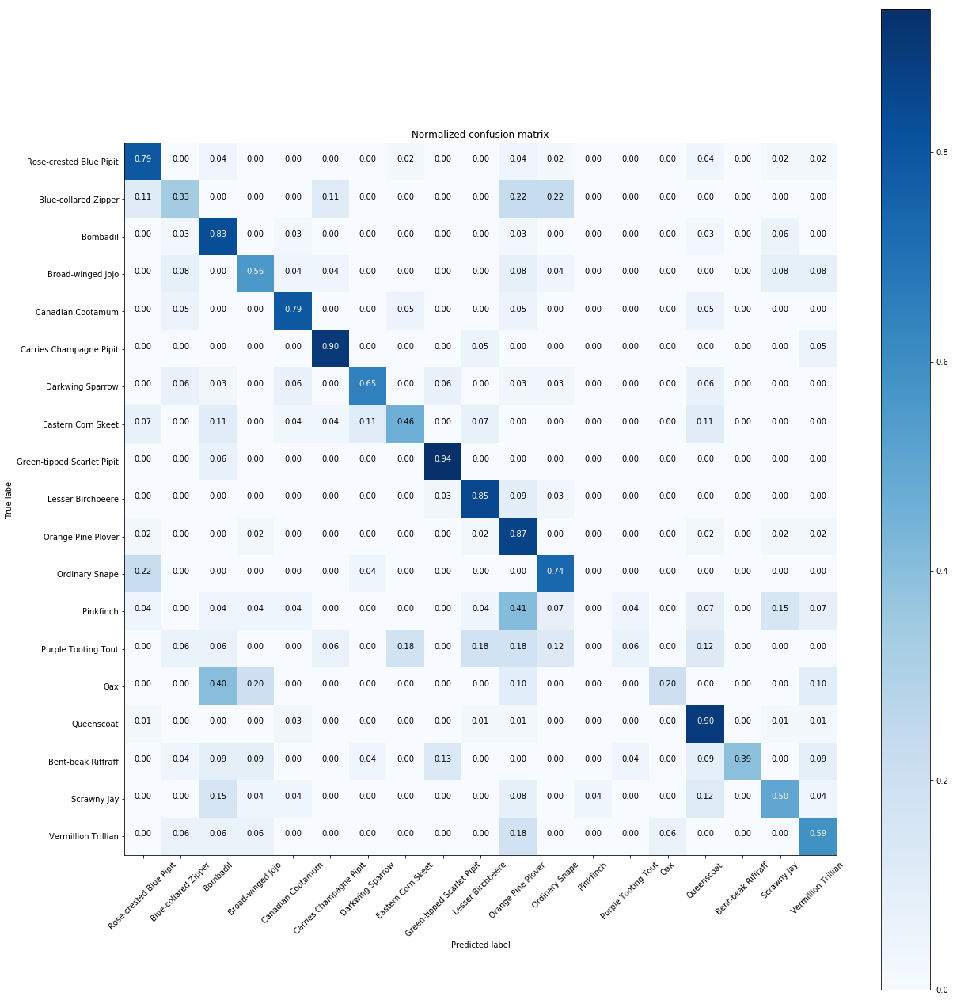

In [336]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import itertools
cm=confusion_matrix(y_test, y_pred)
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')


    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()

# Plot normalized confusion matrix
plt.figure(figsize=(18,18))
plot_confusion_matrix(cm, classes=factor[1].values, normalize=True,
                      title='Normalized confusion matrix')



In [326]:
factor[1].values

array(['Rose-crested Blue Pipit', 'Blue-collared Zipper', 'Bombadil',
       'Broad-winged Jojo', 'Canadian Cootamum',
       'Carries Champagne Pipit', 'Darkwing Sparrow',
       'Eastern Corn Skeet', 'Green-tipped Scarlet Pipit',
       'Lesser Birchbeere', 'Orange Pine Plover', 'Ordinary Snape',
       'Pinkfinch', 'Purple Tooting Tout', 'Qax', 'Queenscoat',
       'Bent-beak Riffraff', 'Scrawny Jay', 'Vermillion Trillian'],
      dtype=object)

#### Test on  Kasios records

In [280]:
RATE = 22050

def read_mp3_as_wav(mp3_dir, wav_dir):
    bird_ids=[]
    audio_list = []
    for mp3_file_name in os.listdir(mp3_dir): #for each file in dir
        file_id = mp3_file_name.split('.')[0].split('-')[-1] # extract file id from file name
        #if int(file_id) in files_id:  # if file id in selected files
        mp3_file = pydub.AudioSegment.from_mp3(mp3_dir + mp3_file_name) #read the mp3 file
        mp3_file.export(wav_dir + file_id + ".wav", format = "wav") #convert it to wav
        audio, _ = librosa.core.load(wav_dir + file_id+ ".wav", sr=RATE, mono=True, offset=0.0, duration=None, res_type='kaiser_best')
        audio_list.append(audio)
        bird_ids.append(int(file_id))
    return audio_list, bird_ids

def extract_feature(X,sample_rate):
    stft = np.abs(librosa.stft(X))
    mfccs = np.mean(librosa.feature.mfcc(y=X, sr=sample_rate, n_mfcc=40).T,axis=0)
    chroma = np.mean(librosa.feature.chroma_stft(S=stft, sr=sample_rate).T,axis=0)
    mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
    contrast = np.mean(librosa.feature.spectral_contrast(S=stft, sr=sample_rate).T,axis=0)
    tonnetz = np.mean(librosa.feature.tonnetz(y=librosa.effects.harmonic(X),
    sr=sample_rate).T,axis=0)
    return mfccs,chroma,mel,contrast,tonnetz

##### Built the new_feature space for a give list of audio_signals #####
def df_new_features(raw_sounds):
    features=np.empty((0,193))
    for X in raw_sounds:
        mfccs, chroma, mel, contrast,tonnetz = extract_feature(X, sample_rate=RATE)
        ext_features = np.hstack([mfccs,chroma,mel, contrast,tonnetz])
        features = np.vstack([features,ext_features])
        df_features=pd.DataFrame(np.array(features), columns = ["X"+str(i) for i in range(193)])
    return df_features

In [290]:
# Reading kasios mp3 files and extracting relevant features 
Kasios_audios, kasios_ids = read_mp3_as_wav(Temp_Kasios_test_mp3, Temp_Kasios_test_wav)

In [292]:
df_features_kasios = df_new_features(Kasios_audios)
df_features_kasios["File ID"]= kasios_ids

Merging Features with Geographical data 

In [293]:
df_kasios = df_kasios.rename(index=str, columns={"ID": "File ID"})
df_features_kasios = pd.merge(df_features_kasios, df_kasios, on ="File ID")
df_features_kasios.drop("File ID", axis=1, inplace=True) 

Saving Data in file.obj 

In [294]:
with open("kasios_features.obj", 'wb') as output:  # Overwrites any existing file.
        pickle.dump(df_features_kasios, output, pickle.HIGHEST_PROTOCOL)

In [304]:
df_features_kasios.head()

,X,Y,X0,X1,X2,X3,X4,X5,X6,X7,...,X183,X184,X185,X186,X187,X188,X189,X190,X191,X192
0,140.0,119.0,-404.479781,69.957969,9.044736,27.427762,8.327471,31.189001,-8.765183,24.104049,...,13.276051,17.142474,18.218333,32.378329,-0.008833,0.035256,-0.027259,0.039826,0.010976,0.017705
1,45.0,39.0,-483.767644,53.547794,25.888335,50.147845,7.883563,3.639721,6.711631,9.178553,...,14.081692,19.995057,20.144142,34.933388,-0.006575,0.009584,-0.011478,0.022144,0.006012,0.007177
2,132.0,106.0,-340.865142,-36.020301,56.364318,72.238019,-30.558804,58.115496,-19.643830,16.348029,...,12.795182,18.128963,25.474825,36.652099,0.029413,0.010804,0.035375,0.005452,0.007826,0.002165
3,61.0,20.0,-483.390438,97.876307,19.042593,30.860015,35.287679,9.653687,14.263828,28.674406,...,13.804603,24.715948,16.611578,29.878526,0.003868,-0.000263,-0.042081,0.025363,0.009108,-0.001107
4,35.0,160.0,-507.581514,-0.711608,36.536354,24.864445,7.109195,20.656086,11.297579,12.180823,...,12.660282,14.156294,16.022572,29.368196,0.004170,0.007922,0.001124,0.019532,-0.001220,0.004962


Adjusting the data form

In [297]:
cols = df_features_kasios.columns.tolist()
cols = cols[-2:] + cols[:-2]
df_features_kasios = df_features_kasios[cols]

In [300]:
df_features_kasios = df_features_kasios.astype(float) #Convert all the dataframe in floats

In [301]:
df_features_kasios.shape

(15, 195)

Processing Kasios Data 

In [309]:
preprocess = make_column_transformer(
    (StandardScaler(), list(df_features_kasios)) #Scale the features
)

In [310]:
features_scaled_kasios = preprocess.fit_transform(df_features_kasios) 

In [311]:
pd.DataFrame(features_scaled_kasios)

,0,1,2,3,4,5,6,7,8,9,...,185,186,187,188,189,190,191,192,193,194
0,1.915796,0.223570,0.972923,1.277264,0.143469,-0.437674,0.028782,0.478262,-0.701962,1.247166,...,-0.542954,-0.572362,-0.503748,-0.506370,-0.839083,1.936018,-0.989791,1.525722,0.669142,2.461521
1,-1.019698,-1.763719,0.077784,0.784235,0.680497,0.440845,0.011595,-1.262030,0.339778,0.152222,...,-0.365205,0.025927,-0.046972,0.499600,-0.619698,0.236055,-0.467002,0.694264,0.170917,0.769595
2,1.668596,-0.099364,1.691115,-1.906759,1.652168,1.295008,-1.476812,2.179214,-1.434201,0.678179,...,-0.649049,-0.365460,1.217395,1.176285,2.876073,0.316838,1.085098,-0.090637,0.352934,-0.035884
3,-0.525299,-2.235700,0.082043,2.116046,0.462233,-0.304959,1.072624,-0.882127,0.848114,1.582450,...,-0.426340,1.016069,-0.884849,-1.490584,0.394652,-0.415980,-1.480768,0.845634,0.481626,-0.561762
4,-1.328697,1.242056,-0.191068,-0.845941,1.019990,-0.536790,-0.018387,-0.187104,0.648456,0.372471,...,-0.678812,-1.198672,-1.024553,-1.691510,0.424002,0.126036,-0.049546,0.571447,-0.554910,0.413545
5,-1.174197,0.372617,-1.113958,-1.196015,-0.370544,-0.323720,-0.396477,-0.754551,0.538299,-0.580191,...,-0.366395,-0.639468,-1.081900,-0.755774,0.357609,-0.824683,0.047693,-0.260267,-0.436280,-0.405412
6,0.988798,0.273252,2.077649,-0.152997,-0.351350,-0.254389,-0.954916,0.588694,-1.190732,0.845564,...,-0.325449,-0.621975,-0.229747,1.207381,0.276787,-0.342485,-0.141956,-0.659234,-0.657816,-0.694569
7,-0.463499,1.068168,-0.077925,-0.612564,-0.204135,2.688537,-0.930325,0.240373,-0.217381,-0.834640,...,-0.200222,-0.087565,0.930155,0.525459,0.005054,-0.349666,-0.940402,-0.383322,-0.395982,-1.387865
8,-0.247199,0.645869,-1.164941,-0.316033,0.164886,0.451781,0.321823,-0.751111,1.153407,0.462580,...,-0.059089,0.213716,0.162242,0.410918,0.451981,-0.174615,1.072155,-1.218543,0.966562,-1.101235
9,0.000000,0.993644,-0.769847,0.151740,0.214500,0.316952,0.178680,-1.061207,0.736883,0.221755,...,-0.061760,0.118105,0.029082,0.323426,-0.159320,-0.212565,-0.352709,-0.114043,-0.498344,0.508402


Test with Random Forest

In [312]:
y_pred_final_model= final_model.predict(features_scaled_kasios)

In [313]:
y_pred_final_model

array([ 0, 10,  0, 10, 15,  6, 10,  0,  4,  6,  4,  8, 17,  9, 15],
      dtype=int64)

#### Final answer concerning kasios recordings

In [322]:
print("The final model predicts that 3 of the kasios recordings correspond to Blue pipits")
for i in range(len(y_pred_final_model)): 
    if y_pred_final_model[i] == 0:
        print("recording " + str(i+1))

The final model predicts that 3 of the kasios recordings correspond to Blue pipits
recording 1
recording 3
recording 8


## 3.4. Conclusions

In [97]:
kasios_pipit = df_kasios[df_kasios['ID'].isin([1, 3, 8])]
p = figure(x_range=(0, 199), y_range=(0, 199), title = "Recordings positions in the Preserve", plot_width=700, plot_height=700)
# set axis labels
p.xaxis.axis_label = 'Coordinate X'
p.yaxis.axis_label = 'Coordinate Y'
#plot map image
p.image(image=[img], x=0, y=0, dw=200, dh=200, global_alpha=0.5, dilate=True)
#plot recordings 
p.circle(df_others["X"], df_others["Y"], fill_alpha=0.6, size=3, legend="Non Blue Pipits recordings from University")
p.circle(df_pipits["X"], df_pipits["Y"], color='blue', fill_alpha=0.7, size=8, legend="Blue Pipits recordings from University")
p.circle(df_kasios["X"], df_kasios["Y"], color='red', size=10, legend="Kasios recordings classified as Non Blue Pipits")
p.circle(kasios_pipit["X"], kasios_pipit["Y"], color='orange', size=10, legend="Kasios recordings classified as Blue Pipits")
#plot waste dumpings
p.square(148, 159, size=19, fill_alpha=0.7, color='green', legend="Kasios waste dumpings")
#legend properties
p.legend.location ="bottom_right"
p.legend.click_policy="hide"
p.add_tools(HoverTool(
    tooltips=[
    ("(X,Y)", "($x, $y)"),
]))
#title properties
p.title.text_font_size = '15pt'
p.title.align = 'center'
#show plot inside notebook
show(p, notebook_handle = True)

# 4. Concluding on Kasios claims <a id="conclusion"></a>

<ul>
<li>There are not many actual blue pipits in the recording provided by Kasios (3 - 1, 3, 8 - among the 15 provided). Hence, we could legitimally doubt about the honesty of Kasios about the health of the birds in the preserve.</li>
<li>As future work, we could design an algorithm that predicts the quality of the Kasios recordings since they might not be always good enough.</li>
<li>We could also think of creating an algorithm that would weight more the high-quality recordings.</li>
<li>Finally, if we really want to check whether blue pipits are happily living and nesting in the preserve, we should send actual ornithologist to check physically. Machine learning and visualization are powerful, but they cannot make predictions with an absolute confidence.</li>
</ul>